## The Tight Binding Model in 1D, the SSH model + Topological Analysis ##

This notebook outlines the tight binding model with mathematical detail, then applies it to describe the band structures for:

1) Diatomic Molecules
2) N-atom Chains 
3) Bipartite Rings
4) The SSH Model 

### Localized Basis and State Expansion

In the tight binding model, we assume a set of localised atomic orbitals, centered on lattice sites in our Hilbert space,

$$
\Set{\ket{\phi_i}}_{i\ge1}\subset \mathcal{H}
$$

and expand the general state as

$$
|\psi\rangle = \sum_i c_i |\phi_i\rangle
$$

where $c_i$ are complex amplitudes, satisying $\lVert \psi \rVert ^2 = \sum_i |c_i|^2 = 1 $

### Main Assumptions

- Electrons are localized around ionic centres; corresponsding wavefunctions decay exponentially away from centres.
- Only nearby hopping is retained (no next-nearest-neighbour hopping and so on)
- Orbitals are approximately orthonormal; 
$\int_{-\infty}^\infty \phi_i(x) \phi_i(x-a) dx \approx 0 $, 
$\int_{-\infty}^\infty \phi_i(x)|^2 dx = 1 $, 

or more compactly, 

$$
\langle \phi_i | \phi_j \rangle \approx \delta_{ij}, \langle \phi_i | \phi_i \rangle = 1
$$

### Finite-Dimensional Subspaces: Mathematical Outline

Mathematically, we let $V = \mathrm{span}\{\phi_i\}_{i=1}^N \subset \mathcal{H}$
be the finite-dimensional subspace generated by the localized orbitals.
The tight binding approximation replaces the full Hilbert space problem
by projecting onto $V$.

Letting $P : \mathcal{H} \to V$ denote the orthogonal projection operator,
defined by $P = \sum_{i=1}^N |\phi_i\rangle \langle \phi_i |$, the general projected state is
$$
P\psi = \sum_i \langle \phi_i , \psi \rangle \phi_i.
$$

To expand the states as vectors (for any vector $\psi \in V$), we have the expansion $\psi = \sum_{i=1}^N c_i \phi_i, $ where $\ c_i=\langle \phi_i , \psi \rangle.$ $V$ is isomorphic to $\mathbb{C}^N$ via the coordinate map $\psi \mapsto (c_1,\dots,c_N)$, and by writing $H_{\mathrm{TB}} = P \hat{H} P \big|_{V}$, the general Hamiltonian's matrix elements in the localized basis are $H_{ij} = \langle \phi_i , \hat{H} \phi_j \rangle$; the Schrödinger equation $\hat{H}\psi = E\psi$ reduces on $V$ to the finite-dimensional eigenvalue problem
$$
\sum_j H_{ij} c_j = E c_i,
$$ 
with $H_{ij} = \langle \phi_i | \hat{H} | \phi_j \rangle.$

### General Tight Binding Hamiltonian

Our general Tight Binding Hamiltonian is of the form
$$
\hat{H} =
\sum_i \epsilon_i |\phi_i\rangle\langle\phi_i|
+ \sum_{i \neq j} t_{ij} |\phi_i\rangle\langle\phi_j|
$$

and as a matrix and after projecting, our Hamiltonian looks like

$$
H =
\begin{pmatrix}
\epsilon_1 & t_{12} & t_{13} & \cdots \\
t_{21} & \epsilon_2 & t_{23} & \cdots \\
t_{31} & t_{32} & \epsilon_3 & \cdots \\
\vdots & \vdots & \vdots & \ddots
\end{pmatrix}
$$

### Periodic Systems and Band Structure ###
Assuming a Bravais lattice with translation
operators $T_{R}$ satisfying $T_{R}\phi_n = \phi_{n+R}$, we have translational invariance, implying that $[\hat{H},T_R]=0.$
Therefore, the Hamiltonian admits a simultaneous eigenbasis labelled by crystal momentum $k$.

The lattice sites are located at positions $R_n$; in one dimension
$R_n = n a$, where $a$ is the lattice spacing.

We introduce Bloch states as a new basis
$$
|\psi_k\rangle =
\frac{1}{\sqrt{N}}\sum_n e^{ikR_n} |\phi_n\rangle,
$$
which implements a discrete Fourier transform from site space to
momentum space. Here, the projected Hamiltonian becomes a family of finite
matrices $H(k)$. Diagonalising $H(k)$ gives eigenvalues $E_n(k)$, yielding our band structure

The following codes will specify this theory to specific cases them implement them in Python; the band structures will be plotted subsequently.

## Part 1: Diatomic Molecule ##

We have two localized orbitals $\{\ket{\phi_1},\ket{\phi_2}\}$, centered a distance $a$ apart.
Hamiltonian:
$$
H =
\begin{pmatrix}
\epsilon_1 & t \\
t & \epsilon_2
\end{pmatrix}.
$$

- $\epsilon_i$ are onsite energies
- $t$ is the hopping amplitude

 We obtain eigenvalues $E_{\plusmn} = \frac{\epsilon_1 + \epsilon_2}{2} \plusmn \sqrt{{(\frac{\epsilon_1 - \epsilon_2}{2}})^2+t^2}$, and eigenstates $\psi_{\plusmn} = \cos(\theta)\phi_1(x) \plusmn \sin(\theta)\phi_2(x-a)$ with $tan(2\theta) = \frac{2t}{\epsilon_1+\epsilon_2}$.

 For $\epsilon = \epsilon_1=\epsilon_2$ we obtain a homonuclear molecule with
bonding and antibonding states, giving $\psi_{\plusmn} = \frac{1}{\sqrt{2}}(\phi_1+\phi_2)$ and $E_{\plusmn} = \epsilon \plusmn |t|$


In [2]:
import matplotlib.pyplot as plt
import numpy as np  
from scipy.linalg import eigh

def diatomic_hamiltonian(eps1, eps2, t):
    return np.array([[eps1, t], [t, eps2]])

H = diatomic_hamiltonian(0.0, 0.0, -1.0) #setting on-site energies to 0 and hopping to -1
E, V = eigh(H)
print("Eigenvalues:", E, "Eigenvectors:\n", V)

Eigenvalues: [-1.  1.] Eigenvectors:
 [[-0.70710678 -0.70710678]
 [-0.70710678  0.70710678]]


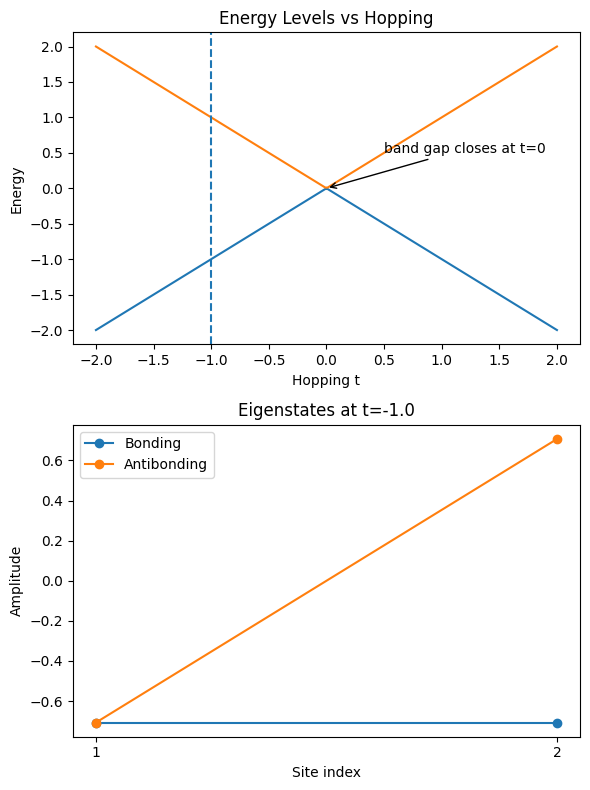

In [3]:
# parameter sweep
ts = np.linspace(-2, 2, 200)
Evals = []

for t in ts:
    E,_ = eigh(diatomic_hamiltonian(0,0,t))
    Evals.append(E)

Evals = np.array(Evals)  #evaluates energies for hopping values from -2 to 2

# choose a representative hopping for wavefunctions
t0 = -1.0
E0, V0 = eigh(diatomic_hamiltonian(0,0,t0))

fig, axes = plt.subplots(2,1, figsize=(6,8)) #subplots

#energies against hopping parameter
axes[0].plot(ts, Evals[:,0]) #first eigenvalue (bonding)
axes[0].plot(ts, Evals[:,1]) #second eigenvalue (antibonding)
axes[0].axvline(t0, linestyle='--')
axes[0].set_xlabel("Hopping t") 
axes[0].set_ylabel("Energy")
axes[0].set_title("Energy Levels vs Hopping")
axes[0].annotate('band gap closes at t=0', xy=(0, 0), xytext=(0.5, 0.5), arrowprops=dict(arrowstyle='->'))

sites = [1,2] #eigenstates for both bonding/antibonding

axes[1].plot(sites, V0[:,0], 'o-', label="Bonding")
axes[1].plot(sites, V0[:,1], 'o-', label="Antibonding")
axes[1].set_xticks(sites)
axes[1].set_xlabel("Site index")
axes[1].set_ylabel("Amplitude")
axes[1].set_title(f"Eigenstates at t={t0}")
axes[1].legend()

plt.tight_layout()
plt.show()

Bonding energy: -1.0
Antibonding energy: 1.0
theta: -0.7853981633974483


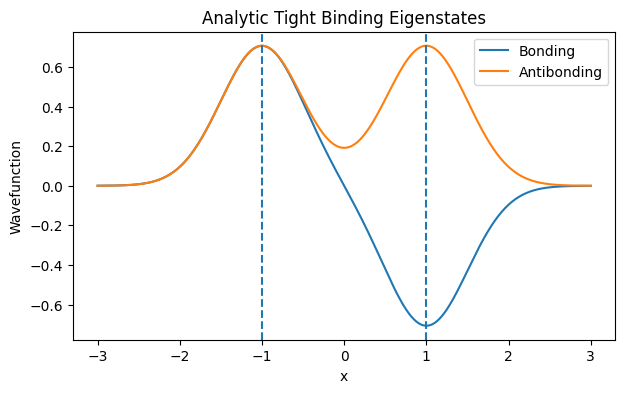

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# orbital model
def gaussian_orbital(x, center, sigma=0.5):
    return np.exp(-(x-center)**2/(2*sigma**2))

# analytic TB solution
def diatomic_analytic(eps1, eps2, t):
    avg = (eps1 + eps2)/2
    diff = (eps1 - eps2)/2
    root = np.sqrt(diff**2 + t**2)
    E_plus, E_minus = avg + root, avg - root
    
    # mixing angle
    theta = 0.5*np.arctan2(2*t, eps1-eps2)
    
    return E_minus, E_plus, theta

# parameters
eps1 = 0.0
eps2 = 0.0
t = -1.0

E_minus, E_plus, theta = diatomic_analytic(eps1,eps2,t)

print("Bonding energy:",E_minus)
print("Antibonding energy:",E_plus)
print("theta:",theta)

x = np.linspace(-3,3,400)

R1 = -1
R2 = 1

phi1 = gaussian_orbital(x,R1)
phi2 = gaussian_orbital(x,R2)

psi_bond = np.cos(theta)*phi1 + np.sin(theta)*phi2
psi_antibond = np.cos(theta)*phi1 - np.sin(theta)*phi2

plt.figure(figsize=(7,4))

plt.plot(x,psi_bond,label="Bonding")
plt.plot(x,psi_antibond,label="Antibonding")

plt.axvline(R1,linestyle='--')
plt.axvline(R2,linestyle='--')

plt.xlabel("x")
plt.ylabel("Wavefunction")
plt.title("Analytic Tight Binding Eigenstates")
plt.legend()
plt.show()

## Part 2: N Atom Chains ##

We now generalise the diatomic molecule to a one-dimensional chain of $N$
localised orbitals $\{\phi_n\}_{n=1}^N$, with each molecule centred at lattice sites
$x_n = n a$, giving a periodic lattice with constant $a$. Our Hilbert space is now trucated to an $N$-dimensional (finite) subspace, $\mathcal{H}_N = \mathrm{span}\{\ket{n}\}_{n=1}^N,$
where $\ket{n}$ denotes the localised orbital at site $n$. (As before we assume the orthonormality condition $\langle m | n \rangle = \delta_{mn}.$)

Within the TBM approximations, the Hamiltonian is truncated to just the on-site energies and nearest-neighbour hopping, giving:
$$
H = \sum_{n=1}^{N} \epsilon_n \ket{n}\bra{n}
+ \sum_{n=1}^{N-1}
\left(
t_{n,n+1} \ket{n}\bra{n+1}
+ t_{n,n+1}^{*} \ket{n+1}\bra{n}
\right).
$$

An arbitrary state $\ket{\psi} \in \mathcal{H}_N$ is expanded as $\ket{\psi} = \sum_{n=1}^N c_n \ket{n}, c_n \in \mathbb{C}.$
Projection onto the site basis yields the discrete Schrodinger equation (with boundary conditions as appropriate)
$$\epsilon_n c_n + t_{n-1,n} c_{n-1} + t_{n,n+1} c_{n+1} = E c_n,$$

Given the lattice is periodic, the boundary condition $c_{l+N}=c_l$ lets us use Bloch's Theorem to write $c_l = u_l e^{ikR_l}$, where $R_l$ is the distance between two sites on the chain $R_l = la$ and $l \in \Z$ the site number. We then express an orbital's magnitude at site $n$ as $c_n = u_l e^{ik(n-l)a}$, leaving:
$$((\epsilon_n - E_n) + t_{n-1,n} e^{-ika} + t_{n,n+1} e^{ika})u_n = 0,$$

With $E_n$ being the lattice energy at site $n$, we can specialise the equation above to solve key cases for N atom chains.

General code (1D Hamiltonian builder/solver, Bloch Hamiltonain, Band Structure Calculator/Plotting):

In [27]:
import numpy as np
import scipy.sparse as sp
import scipy.sparse.linalg as spla
from numpy.linalg import eigh
from ipywidgets import interact
import matplotlib.pyplot as plt

#Hamiltonian builder and solver for general 1D tight-binding models with nearest neighbour hoppings, periodic boundary conditions, and optional sparsity for large systems.
def build_1d_hamiltonian(N, epsilons, hoppings, periodic=True, sparse=True):
    """
    General tight-binding Hamiltonian for 1 Dimension incoporating only NN hoppings.

    Parameters
    ----------
    N : int - number of sites
    epsilons : array - onsite energy pattern (repeats)
    hoppings : array - hopping amplitudes between neighbours (pattern repeats)
    periodic : bool - tells us whether we have periodic boundary conditions or not
    sparse : bool - return sparse matrix if True (allows for faster solving when N is large)

    Returns
    -------
    H : ndarray or sparse matrix - Hamiltonian for given 1D system
    """

    epsilons = np.asarray(epsilons)
    hoppings = np.asarray(hoppings)

    if sparse:
        H = sp.lil_matrix((N, N), dtype=complex)  #builds a sparse matrix in list of lists format; efficient for constructing sparse matrices incrementally
    else:
        H = np.zeros((N, N), dtype=complex) #buils a dense matrix for small systems where sparsity isn't an issue

    # onsite energies
    for i in range(N):
        H[i, i] = epsilons[i % len(epsilons)]  #onsite energies assigned in a repeating pattern along the diagonal

    # hopping
    for i in range(N - 1):
        t = hoppings[i % len(hoppings)] #repeating hoppings, 1st off diagonals
        H[i, i + 1] = t #hoppings to the right
        H[i + 1, i] = np.conjugate(t) #hoppings to the left (hermitian conj. of right)

    # periodic boundary
    if periodic:
        t = hoppings[(N - 1) % len(hoppings)]
        H[0, -1] = t
        H[-1, 0] = np.conjugate(t)

    return H.tocsr() if sparse else H #converts to compressed sparse rows for effiency

#solver for general 1D tight-binding Hamiltonians, can handle both dense and sparse matrices
def solve_hamiltonian(H, k_eigs=None):
    """
    Solve eigenproblem H psi = E psi

    H       : Hamiltonian (dense/sparse)
    k_eigs  : no of eigenvalues to compute (for large sparse systems)
    """

    # check whether matrix is sparse to prevent us from accidentally feeding sparse matrices into dense algorithm (kills performance)
    if sp.issparse(H):

        # if user wants full spectrum
        if k_eigs is None:

            # sparse full diagonalisation is awkward so convert to dense array and solve using eigh (good for dense Hermitians)
            H = H.toarray()
            E, V = eigh(H)
            
        else:
            # eigsh = sparse Hermitian solver, returns k lowest magnitude eigenvalues (appropriate for tbm models)
            E, V = spla.eigsh(H, k=k_eigs, which='SM')

    else:
        # dense case
        E, V = eigh(H)

    # eigenvalues may be tiny-complex due to numerical noise
    return np.real(E), V

# Bloch Hamiltonian for a diatomic chain with alternating on-site energies and two different hoppings (t1, t2) between sites A,B. k are the momenta and a is lattice constant.
def bloch_hamiltonian(k, eps_a, eps_b, t1, t2, a=1.0):

    # build 2x2 momentum-space Hamiltonian
    return np.array([
        [eps_a, t1 + t2*np.exp(-1j*k*a)],
        [t1 + t2*np.exp(1j*k*a), eps_b]
    ], dtype=complex)

#Eigenvalues of the Bloch Hamiltonian give us the band structure of the diatomic chain. We can compute these for a range of k values (across FBZ) to get the full band structure.
def compute_bands(k_vals, eps_a, eps_b, t1, t2, a=1.0):

    bands = []

    for k in k_vals:

        # build k-space Hamiltonian
        Hk = bloch_hamiltonian(k, eps_a, eps_b, t1, t2, a)

        # diagonalise
        E, _ = eigh(Hk) #we only care about eigenvalues for band structure, not eigenvectors

        bands.append(E)

    return np.array(bands)

#Band structure plotting; takes k values from band energies and plots.
def plot_bands(k_vals,bands,epsilon=None,a=1.0,show_gap=True,discrete_energies=None,title="Band Structure"):
    """
    Enhanced band structure plotting.

    k_vals            : array of k points
    bands             : array (Nk, Nb)
    epsilon           : onsite energy reference (optional)
    a                 : lattice spacing
    show_gap          : annotate band gap if present
    discrete_energies : list/array of eigenvalues for finite systems
    """

    fig, ax = plt.subplots(figsize=(6,4))

    # --- plot continuous bands ---
    for i in range(bands.shape[1]):
        ax.plot(k_vals, bands[:, i], lw=2)

    # --- onsite energy reference line ---
    if epsilon is not None:
        ax.axhline(
            epsilon,
            linestyle=":",
            linewidth=1.5,
            label=r"$\epsilon$ reference"
        )

    # --- Brillouin zone edges ---
    kmin = -np.pi/a
    kmax = np.pi/a

    ax.axvline(kmin, linestyle="--", linewidth=1)
    ax.axvline(kmax, linestyle="--", linewidth=1)

    ax.text(kmin, ax.get_ylim()[0], r"$-\pi/a$", ha="right", va="bottom")
    ax.text(kmax, ax.get_ylim()[0], r"$\pi/a$", ha="left", va="bottom")

    # --- band gap detection ---
    if show_gap and bands.shape[1] >= 2:
        upper_valence = np.max(bands[:,0])
        lower_conduction = np.min(bands[:,1])

        gap = lower_conduction - upper_valence
        if gap > 1e-6:
            mid_k = k_vals[len(k_vals)//2]

            ax.annotate(f"Gap ≈ {gap:.3f}", xy=(k_vals[0], lower_conduction), xytext=(k_vals[0], upper_valence-gap/8),
                        arrowprops=dict(arrowstyle='<->'), ha='center', va='bottom')

    # --- discrete energy markers ---
    if discrete_energies is not None:
        k_discrete = np.linspace(-np.pi/a, np.pi/a, len(discrete_energies))
        ax.scatter(k_discrete,discrete_energies,marker="o",zorder=5,label="Finite chain levels")

    ax.set_xlabel("k")
    ax.set_ylabel("Energy")
    ax.set_title(title)
    ax.legend(loc='lower right')
    plt.show()
    

    

# a) *Identical Atom Chain* #
For a uniform chain we take
$$
\epsilon_n = \epsilon, \qquad t_{n,n+1} = t_{n-1,n} = t,
$$
giving the Hamiltonian
$$
H =
\begin{pmatrix}
\epsilon & t & 0 & \cdots & 0 \\
t & \epsilon & t & \cdots & 0 \\
0 & t & \epsilon & \ddots & 0 \\
\vdots & \vdots & \ddots & \ddots & t \\
0 & 0 & 0 & t & \epsilon
\end{pmatrix}.
$$
Bloch's theorem gives eigenstates
$$
\psi_k(n) = \frac{1}{\sqrt{N}} e^{ikna},
$$
with dispersion relation
$$
E(k) = \epsilon + 2 t \cos(ka).
$$


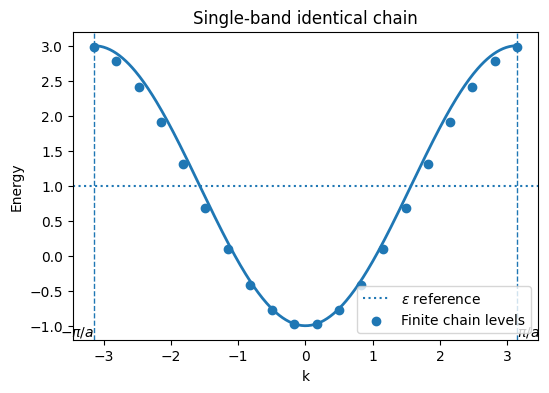

In [28]:
# --- parameters ---
N = 20
epsilon = 1.0
t = -1.0

# --- allowed discrete momenta (periodic chain) ---
k_discrete = np.linspace(-np.pi+np.pi/N, np.pi+np.pi/N, N, endpoint=False)# discrete k values for periodic chain
k_discrete[k_discrete > np.pi] -= 2*np.pi  # bands fold into FBZ for k>pi/a
# --- discrete energies from analytic dispersion ---
E_discrete = epsilon + 2*t*np.cos(k_discrete)

# --- continuous band ---
k_vals = np.linspace(-np.pi, np.pi, 400) #dense k sampling, different to number of sites for plotting
bands = (epsilon + 2*t*np.cos(k_vals))[:,None] #[:,None] adds a new axis to make it (Nk, 1) for consistent plotting with plot_bands

# --- plot ---
plot_bands(
    k_vals,
    bands,
    epsilon=epsilon,
    discrete_energies=E_discrete, 
    title="Single-band identical chain")



# b) *Alternating Atom Chain (general)* #
For an alternating chain, we have a 2-atom basis, with each atom in the basis having its own on-site energies $\epsilon_a$ and $\epsilon_b$ and hopping $t$ from site a-b, but hopping $t'$ from site b-a. Each basis is a distance $a$ apart, atom a is always a distance $\frac{a}{2}$ from b and vice versa.
This gives the hamiltonian
$$
H =
\begin{pmatrix}
\epsilon_a & t & 0 & \cdots & 0 \\
t' & \epsilon_b & t & \cdots & 0 \\
0 & t' & \epsilon_a & \ddots & 0 \\
\vdots & \vdots & \ddots & \ddots & t \\
0 & 0 & 0 & t' & \epsilon_{a/b}
\end{pmatrix}.
$$

Projecing this Shrodinger equation onto the basis $\{\phi_a(x-la), \phi_b(x-la-a/2) \}$ at a given site $l$ and using $c_{l,a} = u_a e^{ikla}$ and $c_{l,b} = u_b e^{iklb}$, we simplify this hamiltonian to k-space and yield:
$$
\begin{pmatrix}
\epsilon_a - E & t+t'e^{-ika} \\
t+t'e^{ika} & \epsilon_b - E
\end{pmatrix}
\begin{pmatrix}
u_a \\
u_b
\end{pmatrix}
=0
$$

Giving energy eigenvalues:
$$E_{\plusmn}(k) = \frac{\epsilon_a + \epsilon_b}{2} \plusmn \sqrt{{(\frac{\epsilon_a - \epsilon_b}{2}})^2+t^2 + t'^2 + 2 t t' \cos(ka)}$$

For any $k \in (-\frac{\pi}{a}, +\frac{\pi}{a})$, the band gap opens and the degeneracy between orbitals lifts. In the case that $t'=t$, we have $E_{\plusmn}(k) = \frac{\epsilon_a + \epsilon_b}{2} \plusmn \sqrt{{(\frac{\epsilon_a - \epsilon_b}{2}})^2+4t^2\cos^2(ka)}$. At $\epsilon_a=\epsilon_b$ and $k = \plusmn \frac{\pi}{2} $, the band gap closes.

<>:77: SyntaxWarning: invalid escape sequence '\e'
<>:77: SyntaxWarning: invalid escape sequence '\e'
<>:77: SyntaxWarning: invalid escape sequence '\e'
<>:77: SyntaxWarning: invalid escape sequence '\e'
C:\Users\danie\AppData\Local\Temp\ipykernel_6668\3957951718.py:77: SyntaxWarning: invalid escape sequence '\e'
  plt.title(f"Bands: $t_2$={t2:.2f}, $\epsilon_a$={eps_a:.2f}, with fixed ($t_1$, $\epsilon_b$)=(-1.0,1.0)")
C:\Users\danie\AppData\Local\Temp\ipykernel_6668\3957951718.py:77: SyntaxWarning: invalid escape sequence '\e'
  plt.title(f"Bands: $t_2$={t2:.2f}, $\epsilon_a$={eps_a:.2f}, with fixed ($t_1$, $\epsilon_b$)=(-1.0,1.0)")
C:\Users\danie\AppData\Local\Temp\ipykernel_6668\1775505138.py:166: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='lower right')


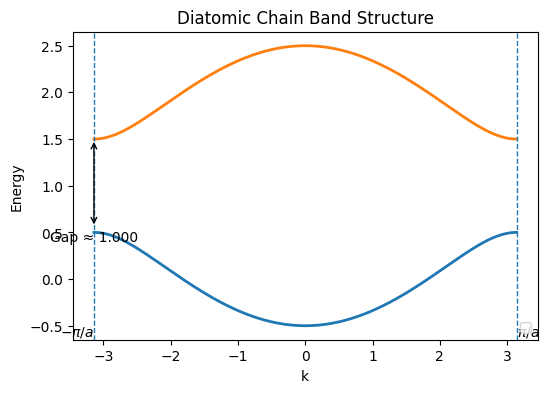

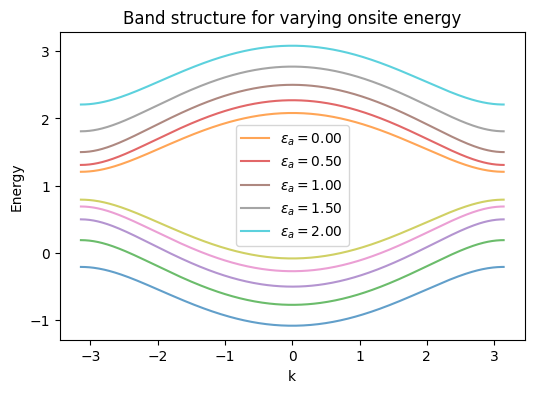

interactive(children=(FloatSlider(value=-0.5, description='t2', max=0.0, min=-4.0), FloatSlider(value=1.0, des…

In [38]:
N = 20
epsilons = [1.0, 1.0]
t = [-1.0, -0.5]
H = build_1d_hamiltonian(N=N,epsilons=epsilons,hoppings=t,periodic=True)

E, V = solve_hamiltonian(H)
k_vals = np.linspace(-np.pi, np.pi, 400) #dense k sampling
bands = compute_bands(k_vals, eps_a=epsilons[0], eps_b=epsilons[1], t1=t[0], t2=t[1])
plot_bands(k_vals, bands, epsilon=None, a=1.0, show_gap=True, discrete_energies=None, title="Diatomic Chain Band Structure")

eps_a = 1.0
eps_b = 0.5
t1 = -1.0
#now we vary the onsite energy of one of the sublattices (eps_a)
# while keeping the other fixed (eps_b=1) and see how the band structure evolves,
# particularly how the band gap changes as we increase the difference in onsite energies.


k_vals = np.linspace(-np.pi, np.pi, 400)

eps_a_vals = np.linspace(0.0, 2.0, 5)
eps_b = 1
t1 = -1.0
t2 = -0.5

plt.figure(figsize=(6,4))

for eps_a in eps_a_vals:
    bands = compute_bands(
        k_vals,
        eps_a=eps_a,
        eps_b=eps_b,
        t1=t1,
        t2=t2
    )

    plt.plot(k_vals, bands[:,0], alpha=0.7)
    plt.plot(k_vals, bands[:,1], alpha=0.7,
             label=f"$\\epsilon_a={eps_a:.2f}$")

plt.xlabel("k")
plt.ylabel("Energy")
plt.title("Band structure for varying onsite energy")
plt.legend()
plt.show()

#finally, we can use ipywidgets to create an interactive plot that allows us
# to vary both the hopping t2 and the onsite energy eps_a in real time and see
# how the band structure changes.

k_vals = np.linspace(-np.pi, np.pi, 400)

def plot_param(t2=-0.5, eps_a=1.0):

    bands = compute_bands(
        k_vals,
        eps_a=eps_a,
        eps_b=1,
        t1=-1.0,
        t2=t2
    )
    bands_std = compute_bands(
        k_vals,
        eps_a=1.0,
        eps_b=1,
        t1=-1.0,
        t2=-0.5
    )
    plt.figure(figsize=(6,4))
    plt.plot(k_vals, bands[:,0])
    plt.plot(k_vals, bands[:,1])
    plt.plot(k_vals, bands_std[:,0], linestyle="--", color="gray", label="Standard (lower)")
    plt.plot(k_vals, bands_std[:,1], linestyle="--", color="gray", label="Standard (upper)")
    plt.xlabel("k")
    plt.ylabel("Energy")
    plt.legend( loc='lower right')
    plt.title(f"Bands: $t_2$={t2:.2f}, $\epsilon_a$={eps_a:.2f}, with fixed ($t_1$, $\epsilon_b$)=(-1.0,1.0)")
    plt.show()

interact(plot_param,
         t2=(-4.0,0.0,0.1),
         eps_a=(0.0,4.0,0.1));




# c) *Bipartite Chain* - SSH Model  #
We now consider a special case of the above, a dimerised lattice consisting of two sublattices
$A$ and $B$ with alternating hopping amplitudes but equal site energies:
$$
t_{2m-1,2m} = t, \qquad
t_{2m,2m+1} = t'. \qquad
\epsilon_a=\epsilon_b=\epsilon
$$
The Hamiltonian becomes
$$
H =
\begin{pmatrix}
\epsilon & t & 0 & \cdots & 0 \\
t' & \epsilon & t & \cdots & 0 \\
0 & t' & \epsilon & \ddots & 0 \\
\vdots & \vdots & \ddots & \ddots & t \\
0 & 0 & 0 & t' & \epsilon
\end{pmatrix}.
$$
Under periodic boundary conditions that give $c_l = u_l e^{ikR_la}$ as above, the Bloch Hamiltonian simplifies to the form
$$
H(k) =
\begin{pmatrix}
\epsilon & t + t' e^{-ika} \\
t + t' e^{ika} & \epsilon
\end{pmatrix},
$$
with energy bands
$$
E_\pm(k) = \epsilon \pm \sqrt{
t^2 + t'^2 + 2 t t' \cos(ka)
}.
$$

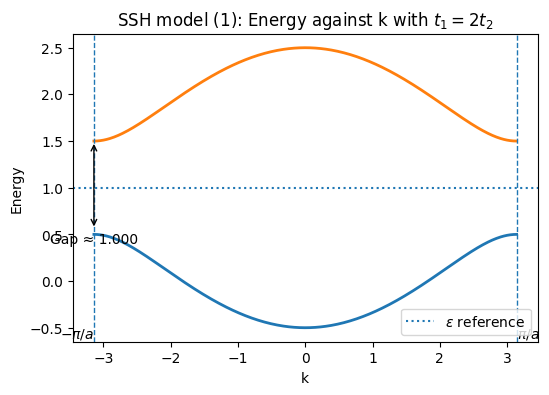

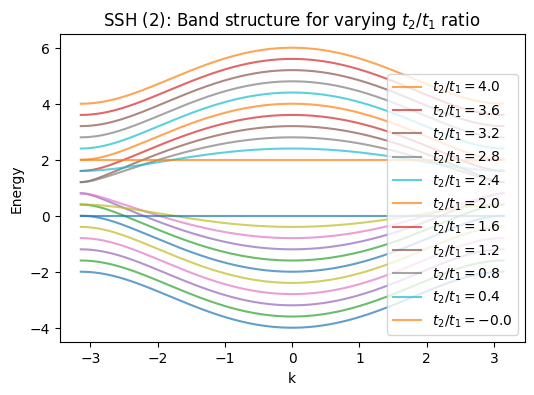

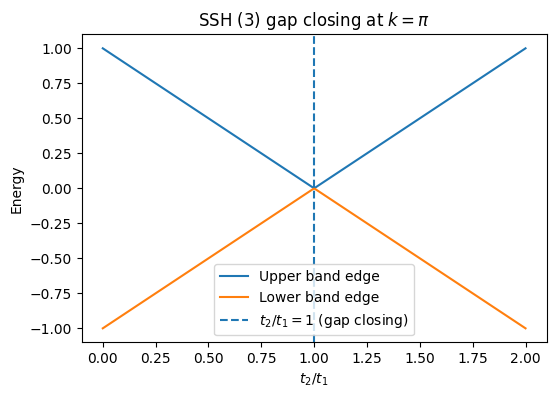

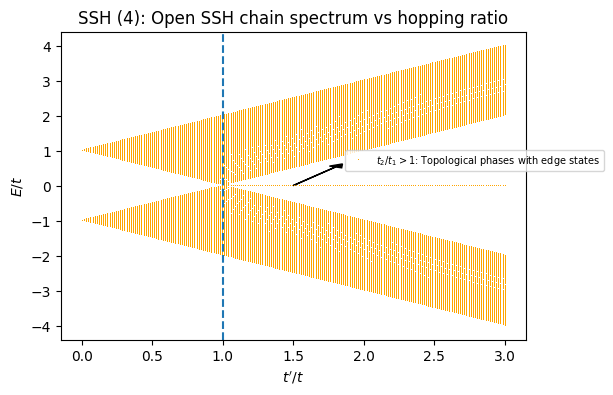

In [153]:
#1)
eps_a = 1.0
eps_b = 1.0
t1 = -1.0
t2 = -0.5
k_vals = np.linspace(-np.pi, np.pi, 400) #dense k sampling, different to number of sites for plotting
bands = compute_bands(k_vals, eps_a=eps_a, eps_b=eps_b, t1=t1, t2=t2)
# --- plot ---
plot_bands(
    k_vals,
    bands,
    epsilon=eps_a, # Use eps_a as the reference energy for plotting
    discrete_energies=None, 
    title="SSH model (1): Energy against k with $t_1=2t_2$")

#2)
# we can vary the second hopping t2 and see how the band structure changes,
# particularly how the band gap evolves as we increase the ratio t2/t1

t2_values = np.linspace(-4.0, 0.0, 11)   # t2 range to explore, keeping t1 fixed at -1.0

plt.figure(figsize=(6,4))

for t2 in t2_values:
    bands = compute_bands(
        k_vals,
        eps_a=eps_a,
        eps_b=eps_b,
        t1=t1,
        t2=t2
    )

    plt.plot(k_vals, bands[:,0], alpha=0.7)
    plt.plot(k_vals, bands[:,1], alpha=0.7,
             label=f"$t_2/t_1={-1*t2:.1f}$")

plt.xlabel("k")
plt.ylabel("Energy")
plt.title("SSH (2): Band structure for varying $t_2/t_1$ ratio")
plt.legend(loc='lower right')
plt.show()

#3)
#varying t2/t1 ratio to see how the gap closes at the critical point t2=t1 (SSH transition)
t1 = 1.0   # fix reference hopping
ratios = np.linspace(0.0, 2.0, 400)   # t2/t1 range

k = np.pi   # critical momentum for SSH transition

E_upper = []
E_lower = []

for r in ratios:

    t2 = r * t1

    E = np.sqrt(
        t1**2 +
        t2**2 +
        2*t1*t2*np.cos(k)
    )

    E_upper.append(E)
    E_lower.append(-E)

E_upper = np.array(E_upper)
E_lower = np.array(E_lower)

plt.figure(figsize=(6,4))

plt.plot(ratios, E_upper, label="Upper band edge")
plt.plot(ratios, E_lower, label="Lower band edge")

plt.axvline(1.0, linestyle="--", label=r"$t_2/t_1=1$ (gap closing)")

plt.xlabel(r"$t_2/t_1$")
plt.ylabel("Energy")
plt.title("SSH (3) gap closing at $k=\\pi$")
plt.legend()
plt.show()


N = 200           # must be even
t1 = -1.0
ratios = np.linspace(0.0, 3.0, 200)
all_E = []
for l in ratios:
    t2 = l*t1
    eps = [0.0, 0.0]      # chiral symmetry
    hops = [t1, t2]       # alternating hopping
    H = build_1d_hamiltonian(N=N,epsilons=eps,hoppings=hops,periodic=False, # Open Chain to see edge states clearly
                             sparse=False)
    E,_ = solve_hamiltonian(H)
    all_E.append(E)

all_E = np.array(all_E)

plt.figure(figsize=(6,4))
for i in range(N):
    plt.plot(ratios, all_E[:,i], ',', color='orange')
plt.axvline(1.0, linestyle='--')
plt.legend(["$t_2/t_1 > 1$: Topological phases with edge states "], bbox_to_anchor=(0.6, 0.53), fontsize=7)
plt.arrow(1.5,0, 0.3, 0.53, head_width=0.1, head_length=0.1, fc='black', ec='black')
plt.xlabel(r"$t'/t$")
plt.ylabel(r"$E/t$")
plt.title("SSH (4): Open SSH chain spectrum vs hopping ratio")
plt.show()

## Topological Analysis of the SSH Model ##

Having established the band structure of the SSH chain and observed the gap closing at $t_1 = t_2$, we now analyse the model from a topological perspective. We specialise to the symmetric case $\epsilon_a = \epsilon_b = 0$, so that the Hamiltonian contains only hopping terms and exhibits an additional symmetry structure.

# 1. Chiral Symmetry #

For $\epsilon_a = \epsilon_b = 0$, the Bloch Hamiltonian takes the form
$$
H(k) =
\begin{pmatrix}
0 & t_1 + t_2 e^{-ika} \\
t_1 + t_2 e^{ika} & 0
\end{pmatrix}.
$$

The absence of diagonal terms implies that the Hamiltonian anticommutes with the matrix
$$
\Gamma = \sigma_z =
\begin{pmatrix}
1 & 0 \\
0 & -1
\end{pmatrix}.
$$

Indeed,
$$
\Gamma H(k) \Gamma^{-1} = -H(k),
$$
or equivalently,
$$
\{\Gamma, H(k)\} = 0.
$$

This relation defines a chiral (sublattice) symmetry. Physically, it reflects the fact that hopping only occurs between the two sublattices $A$ and $B$, and never within the same sublattice.

As a consequence of chiral symmetry, the spectrum is symmetric about zero energy: if $\ket{u}$ is an eigenstate with energy $E$, then $\Gamma\ket{u}$ is an eigenstate with energy $-E$. In particular, zero-energy states are symmetry-protected and cannot be shifted away from zero without either breaking chiral symmetry or closing the bulk energy gap.

# 2. Hamiltonian and the Pauli form

The Bloch Hamiltonian may be written compactly in terms of Pauli matrices as
$$
H(k) = d_x(k)\sigma_x + d_y(k)\sigma_y,
$$
where
\begin{align}
d_x(k) &= t_1 + t_2 \cos(ka), \\
d_y(k) &= t_2 \sin(ka).
\end{align}

There is no $\sigma_z$ component, consistent with the absence of onsite energy imbalance and the presence of chiral symmetry.

The energy eigenvalues are therefore
$$
E_\pm(k) = \pm \sqrt{d_x(k)^2 + d_y(k)^2}.
$$

This representation provides a geometric interpretation of the SSH model. As $k$ varies over the Brillouin zone $(-\pi/a, \pi/a)$, the vector
$$
\mathbf{d}(k) = \big(d_x(k), d_y(k)\big)
$$
traces out a closed curve in the plane.

The qualitative behaviour of this curve depends on the relative magnitudes of $t_1$ and $t_2$:
If $|t_2| < |t_1|$, the curve does not enclose the origin.
If $|t_2| > |t_1|$, the curve winds once around the orign.

Since the origin corresponds to a gap closing ($|\mathbf{d}(k)| = 0$), these two situations cannot be smoothly deformed into one another without closing the bulk gap. This geometric distinction underlies the topological classification of the SSH chain.



In [165]:
%matplotlib inline
import numpy as np

def winding_number(t1, t2, Nk=2000, a=1.0):
    """
    Numerically compute the SSH winding number.
    """

    k_vals = np.linspace(-np.pi/a, np.pi/a, Nk, endpoint=False)
    
    # Compute phase of q(k) = d_x + i d_y
    phases = []
    for k in k_vals:
        dx = t1 + t2*np.cos(k*a)
        dy = t2*np.sin(k*a)
        phases.append(np.angle(dx + 1j*dy))
    
    phases = np.unwrap(phases)
    
    # total phase change
    total_phase_change = phases[-1] - phases[0]
    
    return total_phase_change / (2*np.pi)

from matplotlib.animation import FuncAnimation
from IPython.display import HTML #use HTML to display the animations,
#matplotlib notebook doesn't work for some reason, so we use HTML to show the animation instead

def animate_d_vector(t1=-1.0, t2=-0.5, a=1.0, Nk=200):

    k_vals = np.linspace(-np.pi/a, np.pi/a, Nk)
    dx_vals = t1 + t2*np.cos(k_vals*a)
    dy_vals = t2*np.sin(k_vals*a)

    fig, ax = plt.subplots(figsize=(4,4))
    fig.suptitle("SSH d-vector winding across the Brillouin Zone", fontsize=12)
    ax.plot(dx_vals, dy_vals, lw=2)
    ax.scatter(0,0, color='black')
    ax.set_aspect('equal')
    ax.set_xlabel(r"$d_x$")
    ax.set_ylabel(r"$d_y$")
    ax.set_title(rf"$t_2/t_1 = {t2/t1:.2f}$")

    arrow = ax.quiver(0, 0, dx_vals[0], dy_vals[0],
                      angles='xy', scale_units='xy', scale=1,
                      color='red')

    dot, = ax.plot(dx_vals[0], dy_vals[0], 'ro')

    def update(i):
        arrow.set_UVC(dx_vals[i], dy_vals[i])
        dot.set_data([dx_vals[i]], [dy_vals[i]])

        return arrow, dot

    ani = FuncAnimation(fig, update, frames=Nk, interval=30)

    plt.close(fig)   # prevent static duplicate plot

    return HTML(ani.to_jshtml())
animate_d_vector(t1=1.0, t2=-1.5)

# 3. Winding Number #

The geometric structure identified above allows us to define a topological invariant. 
Since $H(k)$ lies entirely in the $(\sigma_x,\sigma_y)$ plane, we may write
$$
H(k) = 
\begin{pmatrix}
0 & q(k) \\
q^*(k) & 0
\end{pmatrix},
\qquad
q(k) = d_x(k) + i d_y(k).
$$

The complex function $q(k)$ may be written in polar form
$$
q(k) = |q(k)| e^{i\theta(k)},
$$
where
$$
\theta(k) = \arg\!\big(d_x(k) + i d_y(k)\big).
$$

As $k$ varies over the Brillouin zone $(-\pi/a,\pi/a)$, the phase $\theta(k)$ may wind by an integer multiple of $2\pi$. The associated topological invariant is the *winding number*,
$$
\nu = \frac{1}{2\pi} \int_{-\pi/a}^{\pi/a} 
\frac{d\theta(k)}{dk}\, dk.
$$

We can also write this as
$$
\nu = \frac{1}{2\pi} \big[\theta(\pi/a) - \theta(-\pi/a)\big].
$$

Since $\theta(k)$ is only well-defined modulo $2\pi$, the winding number $\nu$ takes integer values.

For the SSH model one finds
$$
\nu =
\begin{cases}
0, & |t_2| < |t_1|, \\
1, & |t_2| > |t_1|.
\end{cases}
$$

The transition between these two phases occurs at $|t_1| = |t_2|$, where the bulk gap closes and $\mathbf{d}(k)=0$ for some $k$. The integer $\nu$ therefore classifies two topologically distinct insulating phases of the SSH chain.




In [166]:
def animate_two_phases_with_winding(t1=1.0,
                                    t2_list=(-0.5, -1.5),
                                    a=1.0,
                                    Nk=100, phases=["Trivial", "Topological"]):

    k_vals = np.linspace(-np.pi/a, np.pi/a, Nk)

    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    fig.suptitle("Winding of d-vector Across the Brillouin Zone for Trivial vs Topological SSH",
             fontsize=14)

    arrows = []
    dots = []
    texts = []
    dx_all = []
    dy_all = []
    theta_all = []

    for ax, t2 in zip(axes, t2_list):

        dx_vals = t1 + t2*np.cos(k_vals*a)
        dy_vals = t2*np.sin(k_vals*a)

        theta_vals = np.unwrap(np.arctan2(dy_vals, dx_vals)) #compute the angle of the d-vector at each k,
        #(unwrap to avoid discontinuities)

        dx_all.append(dx_vals)
        dy_all.append(dy_vals)
        theta_all.append(theta_vals)

        ax.plot(dx_vals, dy_vals, lw=2)
        ax.scatter(0,0, color='black')
        ax.set_aspect('equal')
        ax.set_xlabel(r"$d_x$")
        ax.set_ylabel(r"$d_y$")
        ax.set_title(rf"$t_2/t_1$ = {t2/t1:.2f}$, ν = {np.abs(winding_number(t1, t2)):.0f}$, {phases[0] if np.abs(t2/t1)<0.999 else phases[1]}")
        ax.axhline(0, color = 'gray', linestyle='--')
        arrow = ax.quiver(0, 0, dx_vals[0], dy_vals[0],
                          angles='xy', scale_units='xy', scale=1,
                          color='red')

        dot, = ax.plot([dx_vals[0]], [dy_vals[0]], 'ro')

        text = ax.text(0.05, 0.95, 
                       "W = 0.00",
                       transform=ax.transAxes,
                       verticalalignment='top')

        arrows.append(arrow)
        dots.append(dot)
        texts.append(text)

    def update(i):
        for j in range(len(t2_list)):

            dx = dx_all[j][i]
            dy = dy_all[j][i]

            arrows[j].set_UVC(dx, dy)
            dots[j].set_data([dx], [dy])

            winding = (theta_all[j][i] - theta_all[j][0]) / (2*np.pi)
            texts[j].set_text(f"$\\nu$ = {winding:.2f}")
            angle = np.degrees(theta_all[j][i] - theta_all[j][0])
            texts[j].set_text(f"$\\nu$ = {winding:.2f}\n$\\theta_{{current}}$ = {angle:.1f}°")

        return arrows + dots + texts

    ani = FuncAnimation(fig, update, frames=Nk, interval=30)
    fig.legend(['ν = 1 only for the topoligcal phase,\nwhere the loop wraps the origin'],
               loc='lower left', bbox_to_anchor=(0.05, 0), fontsize=9)
    plt.tight_layout()
    plt.close(fig)

    return HTML(ani.to_jshtml())
animate_two_phases_with_winding()


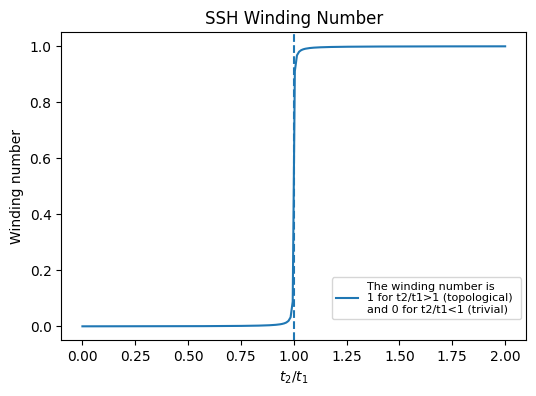

In [167]:

t1 = 1.0
ratios = np.linspace(0.0, 2.0, 200)
w_vals = []

for r in ratios:
    t2 = r * t1
    w_vals.append(winding_number(t1, t2))

plt.figure(figsize=(6,4))
plt.plot(ratios, w_vals)
plt.axvline(1.0, linestyle='--', label=r"$t_2/t_1=1$")
plt.xlabel(r"$t_2/t_1$")
plt.ylabel("Winding number")
plt.title("SSH Winding Number")
plt.legend(['The winding number is \n1 for t2/t1>1 (topological) \nand 0 for t2/t1<1 (trivial)'], bbox_to_anchor=(1, 0.05), loc='lower right', fontsize=8)
plt.show()


# 4. Bulk-Boundary Correspondence #

The winding number has direct physical consequences for a finite chain with open boundary conditions.

When $\nu = 1$ (i.e.\ $|t_2| > |t_1|$), the system supports zero-energy eigenstates localized at the boundaries of the chain. These states are exponentially confined to the edges and are protected by chiral symmetry.

When $\nu = 0$ (i.e.\ $|t_2| < |t_1|$), no such edge states appear.

This correspondence between a bulk topological invariant and boundary-localised modes is known as the *bulk-boundary correspondence*. The numerical spectra obtained for open chains above illustrate this principle: zero-energy edge states emerge precisely in the parameter regime where the bulk winding number is non-zero.


